# Linear models

For the linear models we want to solve the following equation:

\begin{equation}
\rho \ddot{w} + \left(d_1 + d_3 \Delta\right)\dot{w} + (D \Delta \Delta - T_0 \Delta) w = f_{\text{ext}},
\end{equation}

which in modal coordinates $q_{\mu}$ results in uncoupled damped harmonic oscillators:

\begin{equation}
\ddot{q}_{\mu} + 2\gamma_{\mu}\dot{q}_{\mu} + \omega_{\mu}^2 q_{\mu} = \bar{f}_{\text{ext},\mu},
\end{equation}

where the coefficients are given by:

\begin{align}
\omega_{\mu}^2 &= \frac{D\lambda_{\mu}^2 + T_0\lambda_{\mu}}{\rho},\\
\gamma_{\mu} &= \frac{d_1 + d_3\lambda_{\mu}}{2\rho}.
\end{align}


### String

In [ ]:
# | hide
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, Audio
from matplotlib import animation

from jaxdiffmodal.excitations import create_1d_raised_cosine, create_pluck_modal
from jaxdiffmodal.ftm import (
    PlateParameters,
    StringParameters,
    damping_term,
    evaluate_rectangular_eigenfunctions,
    evaluate_string_eigenfunctions,
    inverse_STL,
    inverse_STL_2d,
    plate_eigenfunctions,
    plate_eigenvalues,
    plate_wavenumbers,
    stiffness_term,
    string_eigenfunctions,
    string_eigenvalues,
)
from jaxdiffmodal.time_integrators import (
    solve_sinusoidal,
    solve_sv_excitation,
    solve_tf_excitation,
)

Some parameters for the string

In [ ]:
# | code-fold: true
n_modes = 50
n_steps = 44100
sample_rate = 44100
dt = 1.0 / sample_rate
excitation_position = 0.2
readout_position = 0.5
initial_deflection = 0.03
n_gridpoints = 101  # number of gridpoints for evaluating the eigenfunctions
string_params = StringParameters()

Getting the eigenpairs

In [ ]:
# | code-fold: true

lambda_mu = string_eigenvalues(n_modes, string_params.length)
wn = np.sqrt(lambda_mu)
grid = np.linspace(0, string_params.length, n_gridpoints)
K = string_eigenfunctions(wn, grid)

Get the initial conditions or the excitation

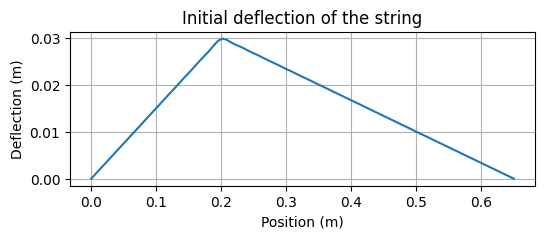

In [ ]:
u0_modal = create_pluck_modal(
    lambda_mu,
    pluck_position=excitation_position,
    initial_deflection=initial_deflection,
    string_length=string_params.length,
)
u0 = inverse_STL(K, u0_modal, string_params.length)
fig, ax = plt.subplots(1, 1, figsize=(6, 2))
ax.plot(grid, u0)
ax.set_xlabel("Position (m)")
ax.set_ylabel("Deflection (m)")
ax.set_title("Initial deflection of the string")
ax.grid(True)

Get $\gamma_{\mu}$ and $\omega_{\mu}$ and integrate in time from the initial conditions defined above. This should be very fast, even for a large number of modes.


In [ ]:
gamma2_mu = damping_term(
    string_params,
    lambda_mu,
)
omega_mu_squared = stiffness_term(
    string_params,
    lambda_mu,
)

modal_sol = solve_sinusoidal(
    gamma2_mu,
    omega_mu_squared,
    u0_modal,
    n_steps,
    dt,
)

Transform the modal solution back to the physical space using the precomputed eigenfunctions, or evaluate at a single point.

In [ ]:
mu = np.arange(1, n_modes + 1)  # mode indices

readout_weights = evaluate_string_eigenfunctions(
    mu,
    readout_position,
    string_params,
)

# at a single point
u_readout = readout_weights @ modal_sol

# at all points
sol = inverse_STL(K, modal_sol, string_params.length)

Single point:

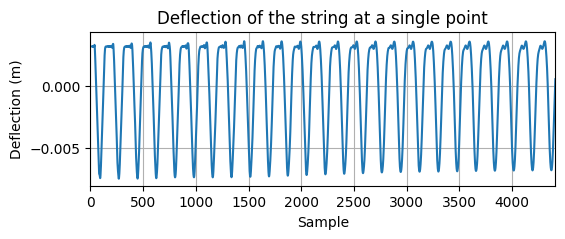

In [ ]:
# | echo: false

display(Audio(u_readout, rate=sample_rate))
fig, ax = plt.subplots(1, 1, figsize=(6, 2))
ax.plot(u_readout)
ax.set_xlabel("Sample")
ax.set_ylabel("Deflection (m)")
ax.set_title("Deflection of the string at a single point")
ax.set_xlim(-2, sample_rate // 10)
ax.grid(True)

All points:

In [ ]:
# | echo: false

n_frames = 2000
frame_stride = 15
positions = np.linspace(0, string_params.length, sol.shape[0])
time_samples = sol[:, :n_frames]

fig, ax = plt.subplots(figsize=(6, 3))
(line,) = ax.plot(positions, time_samples[:, 0])
ax.set_ylim(np.min(time_samples) * 1.1, np.max(time_samples) * 1.1)
ax.set_xlabel("Position (m)")
ax.set_ylabel("Deflection (m)")
ax.set_title("String Vibration")
ax.grid(True)
fig.tight_layout()


def update(i):
    frame = i * frame_stride
    line.set_ydata(time_samples[:, frame])
    return (line,)


ani = animation.FuncAnimation(
    fig,
    update,
    frames=n_frames // frame_stride,
    interval=25,
    blit=True,
)

# Only display the animation, not the still figure
plt.close(fig)
HTML(ani.to_jshtml())

### Plate

We do a very similar thing for plates. First define the parameters

In [ ]:
# | code-fold: true

n_modes_x = 8
n_modes_y = 8
n_modes = n_modes_x * n_modes_y
n_steps = 44100
sample_rate = 44100
dt = 1.0 / sample_rate
excitation_duration = 1.0  # seconds
excitation_amplitude = 1.0
force_position = (0.05, 0.05)
readout_position = (0.1, 0.1)
plate_params = PlateParameters(
    Ts0=0,
    d1=4e-3,
    d3=3e-2,
)

Get the eigenpairs


In [ ]:
# | code-fold: true

wnx, wny = plate_wavenumbers(
    n_modes_x,
    n_modes_y,
    plate_params.l1,
    plate_params.l2,
)
lambda_mu_2d = plate_eigenvalues(wnx, wny)
n_gridpoints_x = 101
n_gridpoints_y = 151
x = np.linspace(0, plate_params.l1, n_gridpoints_x)
y = np.linspace(0, plate_params.l2, n_gridpoints_y)
K = plate_eigenfunctions(wnx, wny, x, y)

# Sort the eigenvalues and get the indices
indices = np.argsort(lambda_mu_2d.ravel())
ky_indices, kx_indices = np.unravel_index(indices, lambda_mu_2d.shape)
ky_indices, kx_indices = ky_indices + 1, kx_indices + 1
selected_indices = np.stack([kx_indices, ky_indices], axis=-1)
lambda_mu = np.sort(lambda_mu_2d.reshape(-1))

This time we will use an excitation force instead on initial conditions. We define the force as a 1D raised cosine at a single point on the plate.

In [ ]:
# | code-fold: true

rc = create_1d_raised_cosine(
    duration=excitation_duration,
    start_time=0.010,
    end_time=0.012,
    amplitude=excitation_amplitude,
    sample_rate=sample_rate,
)

weights_at_ex = (
    evaluate_rectangular_eigenfunctions(
        selected_indices,
        force_position,
        params=plate_params,
    )
    / plate_params.density
)

weights_at_readout = evaluate_rectangular_eigenfunctions(
    selected_indices,
    readout_position,
    params=plate_params,
)

modal_excitation = np.outer(rc, weights_at_ex)

Get $\gamma_{\mu}$ and $\omega_{\mu}$ and integrate in time using the excitation force.

In [ ]:
# | code-fold: true

gamma2_mu = damping_term(
    plate_params,
    lambda_mu,
)
omega_mu_squared = stiffness_term(
    plate_params,
    lambda_mu,
)


def nl_fn(modal_sol):
    return 0.0


_, modal_sol = solve_tf_excitation(
    gamma2_mu,
    omega_mu_squared,
    modal_excitation,
    dt,
    nl_fn=nl_fn,
)

Get the solution in physical space

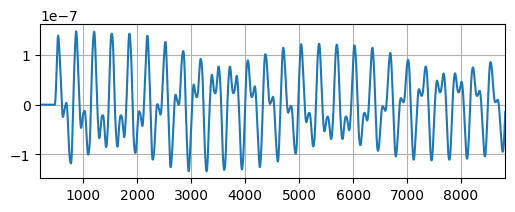

In [ ]:
# | echo: false

sol = modal_sol @ weights_at_readout

fig, ax = plt.subplots(1, 1, figsize=(6, 2))
ax.plot(sol)
ax.grid(True)
ax.set_xlim(200, 4410 * 2)
sol_vel = jnp.diff(sol)
display(Audio(sol_vel, rate=sample_rate))

In [ ]:
# | hide
modal_sol_unsorted = np.zeros_like(modal_sol)
modal_sol_unsorted[:, indices] = modal_sol
modal_sol_unsorted = modal_sol_unsorted.reshape(-1, n_modes_x, n_modes_y)
modal_sol_unsorted = modal_sol_unsorted.transpose(1, 2, 0)
sol = inverse_STL_2d(K, modal_sol_unsorted, plate_params.l1, plate_params.l2)

In [ ]:
# | hide

import matplotlib.animation as animation
from IPython.display import HTML

# Create a figure and axis for the animation

# Get dimensions
n_samples = 2000
sol_reduced = sol[:, :, 400:n_samples]
nx, ny, nt = sol_reduced.shape

# Downsample in time to make animation faster
# Using a larger step to skip more frames since this is audio data (44.1kHz)
step = 15  # Show every 1000th frame (about 44 frames per second)
frames = nt // step

fig, ax = plt.subplots(figsize=(6.4, 4.8))
im = ax.imshow(
    sol_reduced[:, :, 0],
    cmap="viridis",
    origin="lower",
    extent=[0, plate_params.l1, 0, plate_params.l2],
    vmin=sol.min(),
    vmax=sol.max(),
)

# Add a colorbar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label("Displacement")

# Add labels and title
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.set_title("Plate Vibration")


# Animation function
def update(frame):
    # Update the image data
    im.set_array(sol_reduced[:, :, frame * step])
    return [im]


# Create the animation
ani = animation.FuncAnimation(
    fig,
    update,
    frames=frames,
    interval=25,
    blit=True,
)

# Only display the animation, not the still figure
plt.close(fig)
HTML(ani.to_jshtml())